In [52]:
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.optim as optim


In [53]:
path = 'imgs/'

#Load Inception

In [54]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
inception = models.inception_v3(pretrained=True).to(device)
inception.eval()

c:\Users\11730\OneDrive\桌面\420a2\a2dataset\venv\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\11730\OneDrive\桌面\420a2\a2dataset\venv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [55]:
# Function to load and preprocess an image
# remember 299 for inception v3 and 400 for mobile net
def load_image(image_path, size=299):
    """Load and preprocess an image."""
    image = Image.open(image_path).convert('RGB')
    in_transform = transforms.Compose([
        transforms.Resize((size, size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    return in_transform(image).unsqueeze(0)

def imshow(tensor, title=None, ax=None, figsize=(5, 5)):
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    image = tensor.cpu().clone().detach().numpy().squeeze()
    image = image.transpose(1, 2, 0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)
    
    ax.imshow(image)
    if title is not None:
        ax.set_title(title)
    ax.axis('off')


# Function to extract features from specified layers of the model
def get_features_incept(image, model, layers):
    """ Extract features from the layers of the model. """
    features = {}
    x = image
    # Access each layer directly by name and ensure compatible operations
    for name, layer in model.named_children():
        if "AuxLogits" in name:  # Skip auxiliary classifier
            continue
        x = layer(x)
        if name in layers:
            features[name] = x
        if name == 'Mixed_7c':  # Last layer you need features from
            break
    return features


# Function to compute the Gram matrix of a feature map
def gram_matrix(tensor):
    """Compute the Gram matrix from an input tensor."""
    _, d, h, w = tensor.size()
    tensor = tensor.view(d, h * w)
    return torch.mm(tensor, tensor.t())

def content_loss(content_features, target_features):
    return torch.mean((target_features - content_features)**2)

def style_loss(target_feature, style_gram):
    target_gram = gram_matrix(target_feature)
    return torch.mean((target_gram - style_gram) ** 2)


def incept_style_transfer(content_layer, content_image, style_image, target, content_weight, style_weight, style_weights, optimizer, steps, show_every, show_training=True):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    target = target.to(device)
    content_features = get_features_incept(content_image, inception, [content_layer])  # Assuming `inception` and `get_features_incept` defined elsewhere
    style_features = get_features_incept(style_image, inception, list(style_weights.keys()))

    for ii in range(1, steps + 1):
        optimizer.zero_grad()

        target_features = get_features_incept(target, inception, style_weights.keys())
        content_loss_val = content_loss(content_features[content_layer], target_features[content_layer])

        style_loss_val = 0
        for layer, weight in style_weights.items():
            target_feature = target_features[layer]
            target_gram = gram_matrix(target_feature)
            _, d, h, w = target_feature.shape
            style_gram = gram_matrix(style_features[layer])
            layer_style_loss = weight * torch.mean((target_gram - style_gram) ** 2)
            style_loss_val += layer_style_loss / (d * h * w)

        total_loss = content_weight * content_loss_val + style_weight * style_loss_val
        total_loss.backward(retain_graph=True)
        optimizer.step()

        if show_training and (ii % show_every == 0 or ii == 1):
            print(f'Iteration: {ii}, Total loss: {total_loss.item()}')
            imshow(target)  # Assuming imshow is defined elsewhere
            plt.show()
    return target


In [56]:
def inception_wrap(content_path, style_path, steps,show_every,show_training=True):
    # Define fixed parameters
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    content_layer = 'Mixed_5b'
    content_weight = 1e3
    style_weight = 1e6
    style_layers = {
        'Conv2d_1a_3x3': 0.9, 
        'Conv2d_2a_3x3': 0.7,
        'Conv2d_2b_3x3': 0.4,
        'Mixed_5b': 0.1,
        'Mixed_5c': 0.1
    }
    show_every = show_every
    
    # Prepare the images
    content_image = load_image(content_path,299)
    style_image = load_image(style_path,299)
    content_image = content_image.to(device)
    style_image = style_image.to(device)
    if show_training:
        imshow(content_image)
        imshow(style_image)
    # Clone the content image for the target image and make it require gradient
    target = content_image.clone().requires_grad_(True).to(device)

    # Set up the optimizer
    optimizer = optim.Adam([target.requires_grad_()], lr=0.02)
    # Call the original function with all parameters set
    final_image = incept_style_transfer(
        content_layer=content_layer, 
        content_image=content_image, 
        style_image=style_image, 
        target=target, 
        content_weight=content_weight, 
        style_weight=style_weight, 
        style_weights=style_layers, 
        optimizer=optimizer, 
        steps=steps, 
        show_every=show_every,
        show_training=show_training
    )

    return final_image



#Load Mobilenet

In [57]:
mobilenet = models.mobilenet_v2(pretrained=True).features
for param in mobilenet.parameters():
    param.requires_grad_(False)
    
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
mobilenet.to(device)

c:\Users\11730\OneDrive\桌面\420a2\a2dataset\venv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2dNormActivation(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU6(inplace=True)
  )
  (1): InvertedResidual(
    (conv): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (2): InvertedResidual(
    (conv): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (

In [58]:
def get_features_mobile(image, model, layers=None):
    if layers is None:
        layers = {
            '0': 'conv1_1',  # Style layer
            '1': 'conv2_1',  # Style layer
            '2': 'conv3_1',  # Style layer
            '3': 'conv4_1',  # Style layer
            '4': 'conv5_1',  # Content layer
            '5': 'conv6_1',  # Style layer
            '6': 'conv7_1',  # Style layer
            '7': 'conv8_1',  # Style layer
            '8': 'conv9_1',  # Style layer
            '9': 'conv10_1',  # Style layer
            '10': 'conv11_1',  # Style layer
            '11': 'conv12_1',  # Style layer
            '12': 'conv13_1',  # Style layer
            '13': 'conv14_1',  # Style layer
            '14': 'conv15_1',  # Style layer
            '15': 'conv16_1',  # Style layer
            '16': 'conv17_1',  # Style layer

        }

    features = {}
    x = image
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
    return features


In [59]:
def mobile_style_transfer(content_layer, content_image, style_image, target, content_weight, style_weight, style_weights, optimizer, steps, show_every,show_training= True):
    content_features = get_features_mobile(content_image, mobilenet)
    style_features = get_features_mobile(style_image, mobilenet)
    target_features = get_features_mobile(target, mobilenet)
    
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

    # content_layer = 'conv5_1'

    optimizer = optim.Adam([target.requires_grad_()], lr=0.02)

    for ii in range(1, steps + 1):
        target_features = get_features_mobile(target, mobilenet)

        content_loss_val = content_loss(content_features[content_layer], target_features[content_layer])

        style_loss_val = 0

        for layer in style_weights:
            target_feature = target_features[layer]
            target_gram = gram_matrix(target_feature)
            _, d, h, w = target_feature.shape
            style_gram = style_grams[layer]
            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
            style_loss_val += layer_style_loss / (d * h * w)

        total_loss = content_weight * content_loss_val + style_weight * style_loss_val

        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        if (ii % show_every == 0 or ii == 1) and show_training:
            print('Iteration:', ii, 'Total loss:', total_loss.item())
            imshow(target)
            plt.show()

    return target


def mobile_wrap(content_path,style_path,steps,show_every,show_training=True):
    # Example usage:
    style_weights = {'conv1_1': 0.9,
                    'conv2_1': 0.7,
                    'conv3_1': 0.5,
                    'conv4_1': 0.2,
                    'conv5_1': 0.2,'conv6_1': 0.1,'conv7_1': 0.1,'conv8_1': 0.1,'conv9_1': 0.1}

    content_weight = 1e2
    style_weight = 1e6
    content_layer = 'conv5_1'
    content_image = load_image(content_path,400).to(device) 
    style_image = load_image(style_path,400).to(device)
    if show_training:
        imshow(content_image)
        imshow(style_image)
    target = content_image.clone().detach()
    target.requires_grad_(True)
    optimizer = optim.Adam([target], lr=0.02)
    steps = steps
    show_every = show_every
    final_image = mobile_style_transfer(content_layer,
                                         content_image,
                                        style_image,
                                        target,
                                        content_weight,
                                        style_weight,
                                        style_weights,
                                        optimizer,
                                        steps,
                                        show_every, show_training=show_training)
    return final_image



#Load Efficientnet

In [60]:
efficientnet = models.efficientnet_b0(pretrained=True).features
for param in efficientnet.parameters():
    param.requires_grad_(False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
efficientnet.to(device)

c:\Users\11730\OneDrive\桌面\420a2\a2dataset\venv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2dNormActivation(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SiLU(inplace=True)
  )
  (1): Sequential(
    (0): MBConv(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): SiLU(inplace=True)
        )
        (1): SqueezeExcitation(
          (avgpool): AdaptiveAvgPool2d(output_size=1)
          (fc1): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
          (fc2): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
          (activation): SiLU(inplace=True)
          (scale_activation): Sigmoid()
        )
        (2): Conv2dNormActivation(
          (0): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), 

In [61]:
def get_features_efficient(image, layers=None):
    """ Extracts the features from an image given the specified layers. """
    if layers is None:
        layers = {
            '0': 'style1',
            '1': 'style2',
            '2': 'style3',
            '3': 'style4',
            '4': 'content'
        }

    features = {}
    x = image
    for name, layer in enumerate(efficientnet.children()):
        x = layer(x)
        if str(name) in layers:
            features[layers[str(name)]] = x
            if len(features) == len(layers):
                break
    return features

In [62]:
def efficient_style_transfer(content_layer, content_img, style_img, num_steps, style_weight, content_weight, show_every, show_training=True):
    """ Runs the style transfer. """
    target = content_img.clone().requires_grad_(True)
    optimizer = optim.Adam([target], lr=0.01)

    style_features = get_features_efficient(style_img)
    content_features = get_features_efficient(content_img)

    # Calculate the style Gram matrices for each layer
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features if 'style' in layer}

    for step in range(num_steps):
        target_features = get_features_efficient(target)

        # Calculate losses
        c_loss = content_loss(content_features[content_layer], target_features[content_layer])
        s_loss = sum(style_loss(target_features[layer], style_grams[layer]) for layer in style_grams)

        # Update target image
        optimizer.zero_grad()
        total_loss = content_weight*c_loss + style_weight*s_loss
        total_loss.backward()
        optimizer.step()

        if (step % show_every == 0 or step == 1) and show_training:
            print('Iteration:', step, 'Total loss:', total_loss.item())
            imshow(target)
            plt.show()

    return target

In [63]:
def efficient_wrap(content_path,style_path,steps,show_every,show_training=True):
    content_weight = 1e2
    style_weight = 1e6
    content_layer = 'content'
    content_image = load_image(content_path,400).to(device)
    style_image = load_image(style_path,400).to(device)
    steps = steps
    show_every = show_every
    final_image = efficient_style_transfer(content_layer, content_image, style_image, steps, style_weight, content_weight, show_every,show_training=show_training)
    return final_image

In [64]:
vgg = models.vgg19(pretrained=True).features

# freeze all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg.to(device)

def get_features_vgg(image, model):
    layers = {'0': 'conv1_1',
                  '5': 'conv2_1', 
                  '10': 'conv3_1', 
                  '19': 'conv4_1',
                  '21': 'conv4_2',  ## content representation
                  '28': 'conv5_1'}
    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}

def vgg_wrap(content_path,style_path,steps,show_every,show_training=True):
    content = load_image(content_path,400).to(device)
    style = load_image(style_path,400).to(device)

    content_weight = 1e3  # alpha
    style_weight = 1e6  # beta
    # for displaying the target image, intermittently
    show_every = show_every
    content_features = get_features_vgg(content, vgg)
    style_features = get_features_vgg(style, vgg)
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}
    # iteration hyperparameters
    target = content.clone().requires_grad_(True).to(device)
    optimizer = optim.Adam([target], lr=0.03)
    steps = steps # decide how many iterations to update your image (5000)

    for ii in range(1, steps+1):
        
        # get the features from  target image
        target_features_vgg = get_features_vgg(target, vgg)
        # the content loss
        content_loss = torch.mean((target_features_vgg['conv4_2'] - content_features['conv4_2'])**2)
        
        # the style loss
        # initialize the style loss to 0
        style_loss = 0
        # then add to it for each layer's gram matrix loss
        for layer in style_weights:
            # get the "target" style representation for the layer
            target_feature = target_features_vgg[layer]
            target_gram = gram_matrix(target_feature)
            _, d, h, w = target_feature.shape
            # get the "style" style representation
            style_gram = style_grams[layer]
            # the style loss for one layer, weighted appropriately
            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
            # add to the style loss
            style_loss += layer_style_loss / (d * h * w)
            
        # calculate the *total* loss
        total_loss = content_weight * content_loss + style_weight * style_loss
        
        # update your target image
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()
        
        # display intermediate images and print the loss
        if  show_training and (ii % show_every == 0):
            print('Total loss: ', total_loss.item())
            imshow(target)
            plt.show()
    return target



c:\Users\11730\OneDrive\桌面\420a2\a2dataset\venv\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [65]:
def show_images(images, titles=None, figsize=(15, 5)):
    n = len(images)
    fig, axs = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axs = [axs]  # make it iterable
    for i, (img, ax) in enumerate(zip(images, axs)):
        image = img.cpu().clone().detach().numpy().squeeze()
        image = image.transpose(1, 2, 0)
        image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
        image = np.clip(image, 0, 1)
        
        ax.imshow(image)
        if titles and len(titles) > i:
            ax.set_title(titles[i])
        ax.axis('off')
    plt.show()




In [66]:
# mobile_wrap("flower.jpg","cat.jpg",8000,1000)


In [67]:
def incept_formula(contents, styles):
    #path was defined to be "imgs/" at the beginning, change it as you need
    styles1 = styles
    content1 = contents
    vis1 = []

    for j, cont in enumerate(content1):
        print(f'doing style transfer for content{j}:')
        for i,sty in enumerate(styles1):

            print(f'with style{i}')
            stypath = path + sty + ".jpg"
            contpath = path + cont + ".jpg"
            content = load_image(contpath,299)
            style = load_image(stypath,299)

            final = inception_wrap(contpath,stypath,  4000, 1000,show_training=False)
            vis1.append((content,style,final))



    for content,style,final in enumerate(vis1):
        show_images([content,style,final],['content','style','final'])
    return vis1

In [68]:
def mobile_formula(contents, styles):
    #path was defined to be "imgs/" at the beginning, change it as you need 
    styles1 = styles
    content1 = contents
    vis1 = []
    for j, cont in enumerate(content1):
        print(f'doing style transfer for content{j}:')
        for i,sty in enumerate(styles1):
            print(f'with style{i}')
            stypath = path + sty + ".jpg"
            contpath = path + cont + ".jpg"
            content = load_image(contpath,400)
            style = load_image(stypath,400)
            final = mobile_wrap(contpath,stypath,  4000, 1000,show_training=False)
            vis1.append((content,style,final))

    for content,style,final in vis1:
        show_images([content,style,final],['content','style','final'])
    return vis1

In [69]:
def efficient_formula(contents, styles):
    #path was defined to be "imgs/" at the beginning, change it as you need 
    styles1 = styles
    content1 = contents
    vis1 = []
    for j, cont in enumerate(content1):
        print(f'doing style transfer for content{j}:')
        for i,sty in enumerate(styles1):
            print(f'with style{i}')
            stypath = path + sty + ".jpg"
            contpath = path + cont + ".jpg"
            content = load_image(contpath,400)
            style = load_image(stypath,400)
            final = efficient_wrap(contpath,stypath,  4000, 1000,show_training=False)
            vis1.append((content,style,final))

    for content,style,final in vis1:
        show_images([content,style,final],['content','style','final'])
    return vis1

In [70]:
# vgg_wrap("imgs/content2.jpg","imgs/style2.jpg",4000,1000)
def vgg_formula(contents, styles):
    #path was defined to be "imgs/" at the beginning, change it as you need
    styles1 = styles
    content1 = contents
    vis1 = []
    for j, cont in enumerate(content1):
        print(f'doing style transfer for content{j}:')
        for i,sty in enumerate(styles1):
            print(f'with style{i}')
            stypath = path + sty + ".jpg"
            contpath = path + cont + ".jpg"
            content = load_image(contpath,299)
            style = load_image(stypath,299)
            final = vgg_wrap(contpath,stypath,  4000, 1000,show_training=False)
            vis1.append((content,style,final))

    for content,style,final in vis1:
        show_images([content,style,final],['content','style','final'])
    return vis1

In [71]:
styles1 = ['glass1','glass2','glass3','glass4']
content1 = ['artemis']
incept_formula(content1,styles1)

# so for these xxx_formula, u can just put a list of contents and a list of styles and we get a nice plot

doing style transfer for content0:
with style0
with style1
with style2
with style3


ValueError: not enough values to unpack (expected 3, got 2)

doing style transfer for content0:
with style0
with style1
with style2
with style3


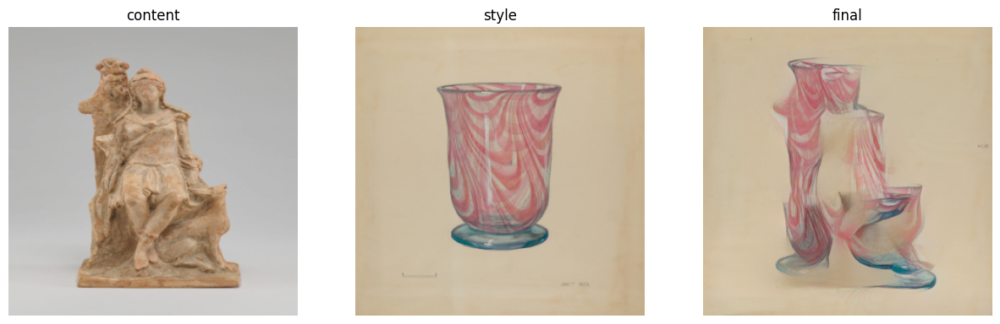

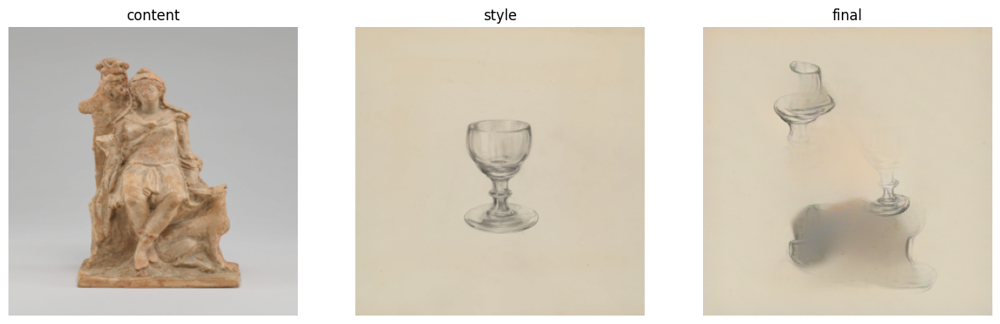

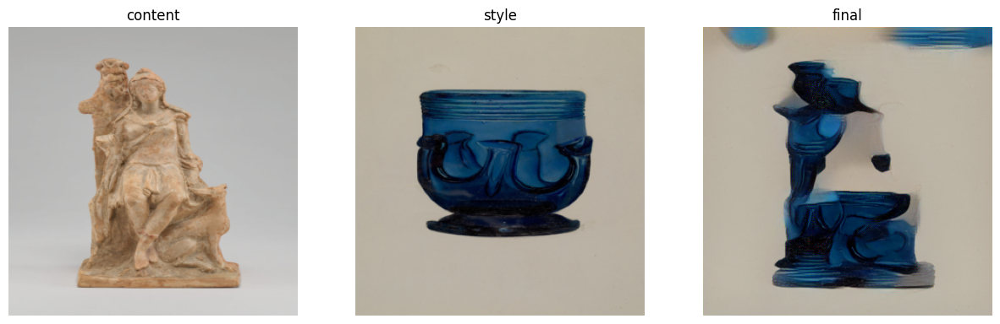

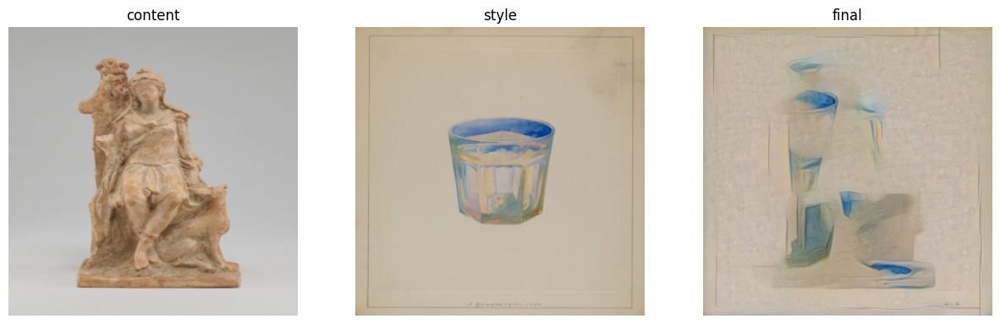

In [ ]:
vgg_formula(content1,styles1)

doing style transfer for content0:
with style0
doing style transfer for content1:
with style0
doing style transfer for content2:
with style0
doing style transfer for content3:
with style0


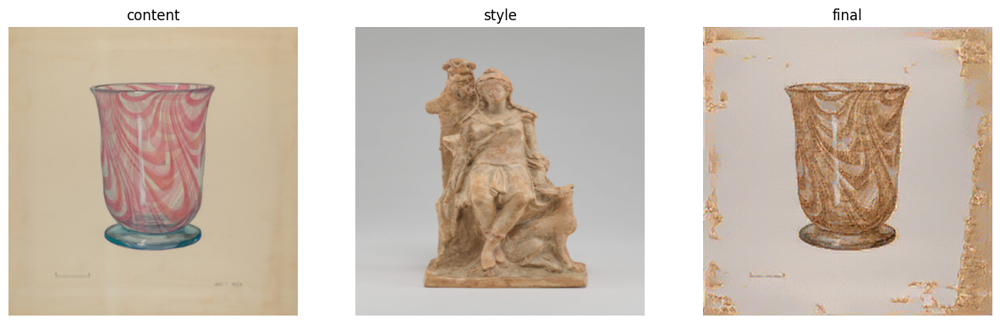

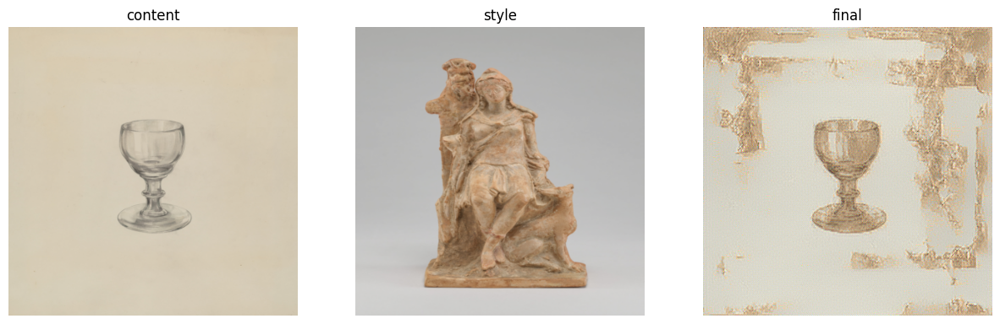

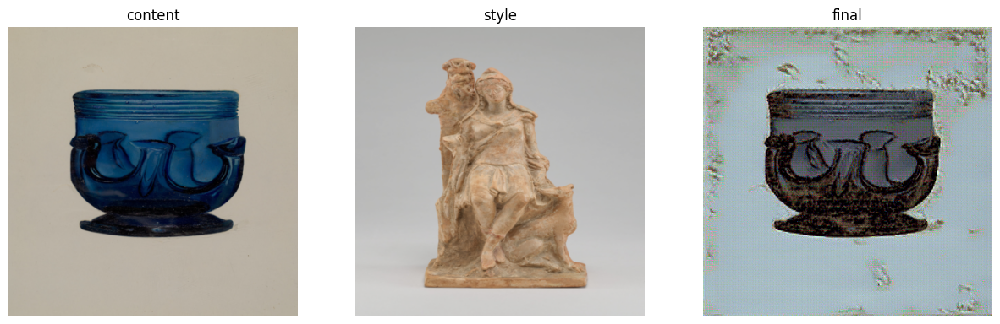

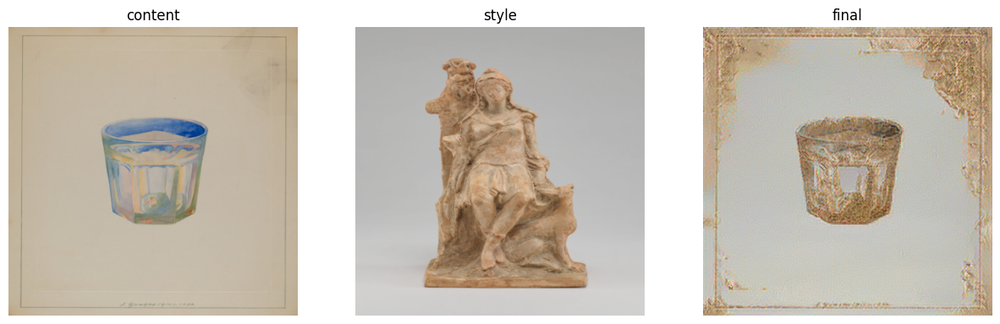

In [ ]:
mobile_formula(styles1,content1)

doing style transfer for content0:
with style0
with style1
with style2
with style3


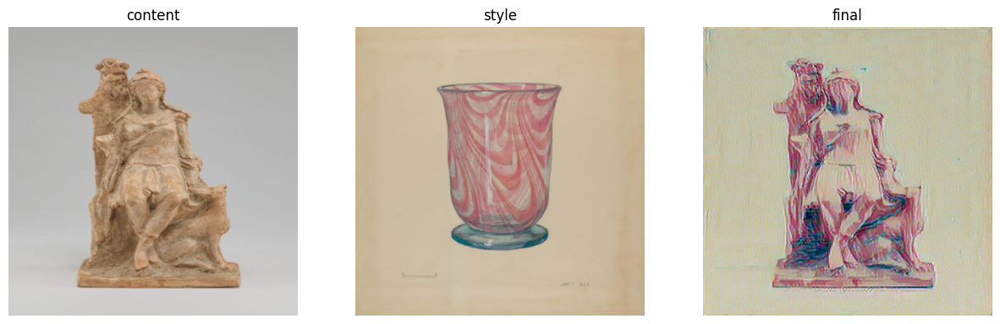

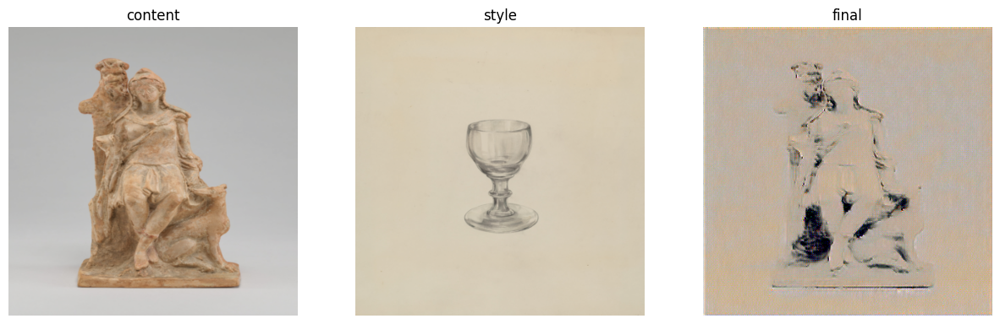

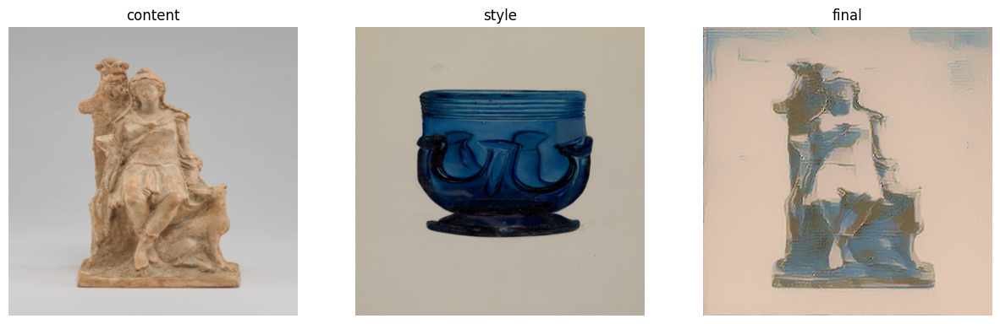

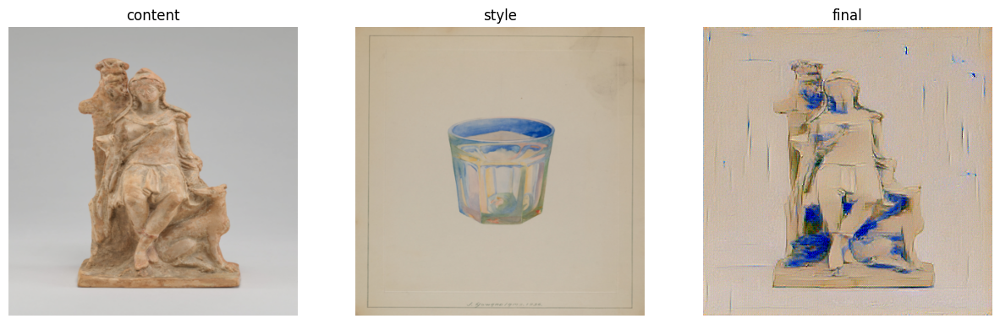

In [ ]:
mobile_formula(content1,styles1)

doing style transfer for content0:
with style0
with style1
with style2
with style3


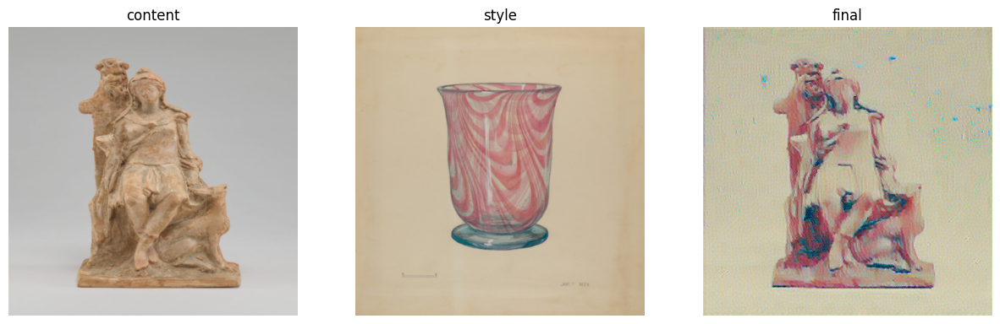

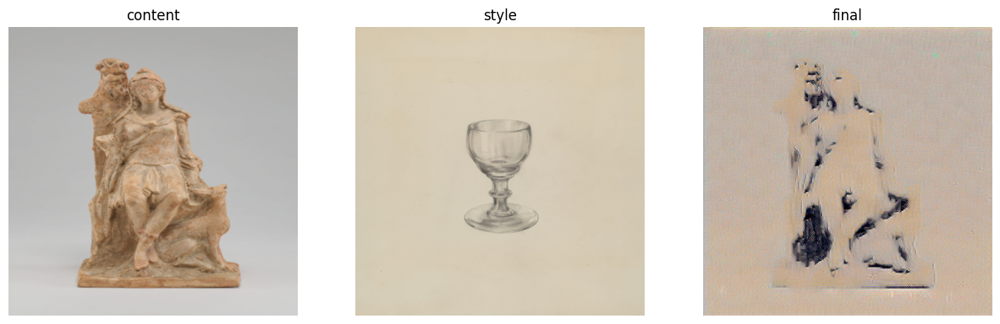

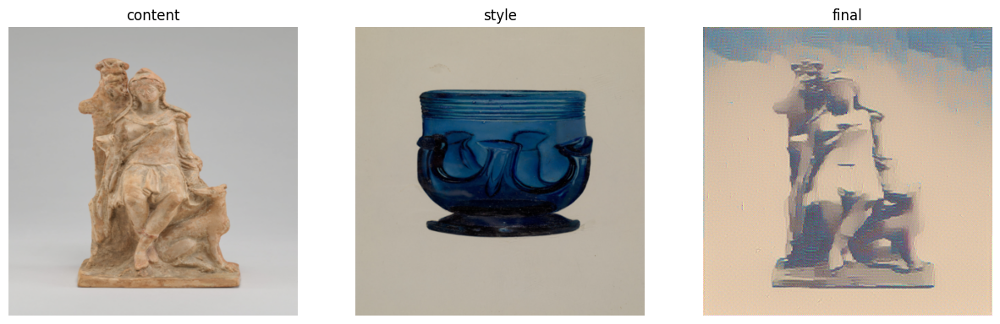

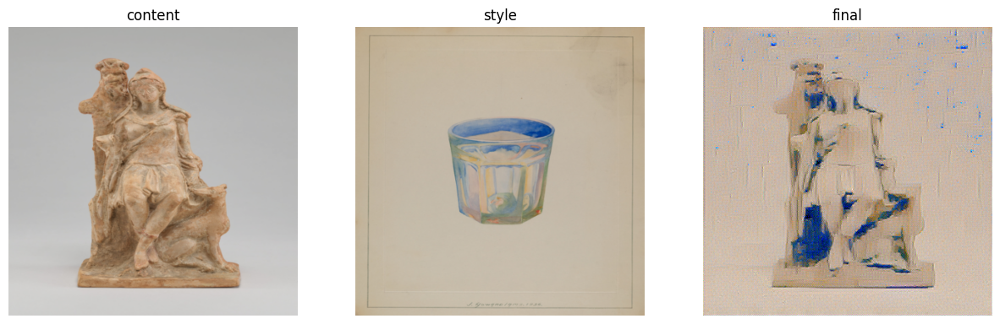

In [ ]:
efficient_formula(content1,styles1)

In [ ]:
content2 = ['ein']
style2 = ['artemis','christ_blessing','yamada','lucy']


In [ ]:
print(f'efficient net results:')
efficient_formula(content2,style2)
print(f'inception-v3 results')
incept_formula(content2,style2)
print(f'vgg results')
vgg_formula(content2,style2)


doing style transfer for content0:
with style0
with style1
with style2
with style3


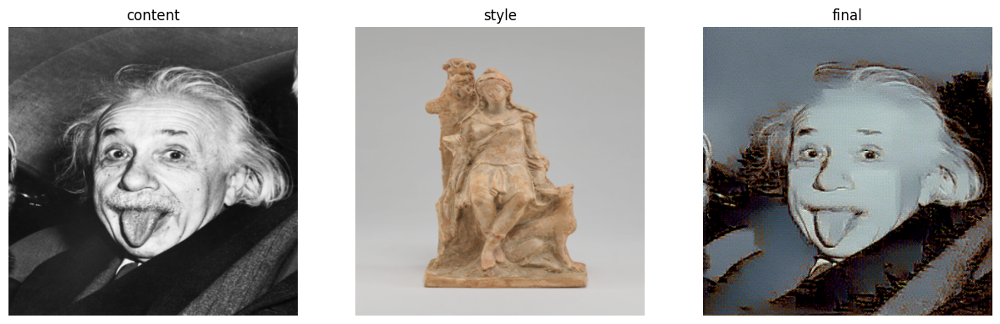

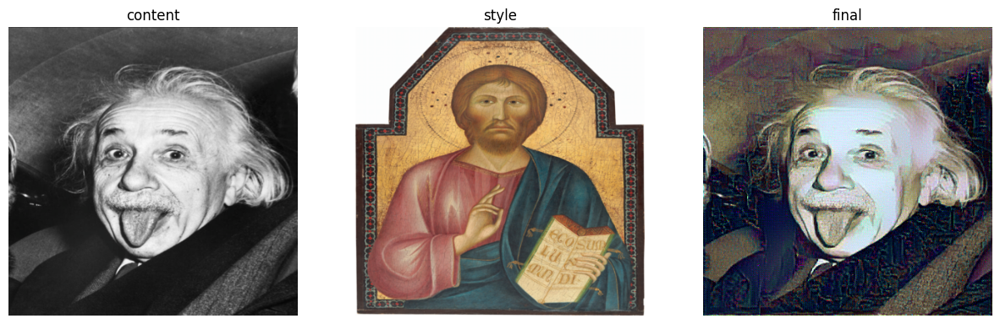

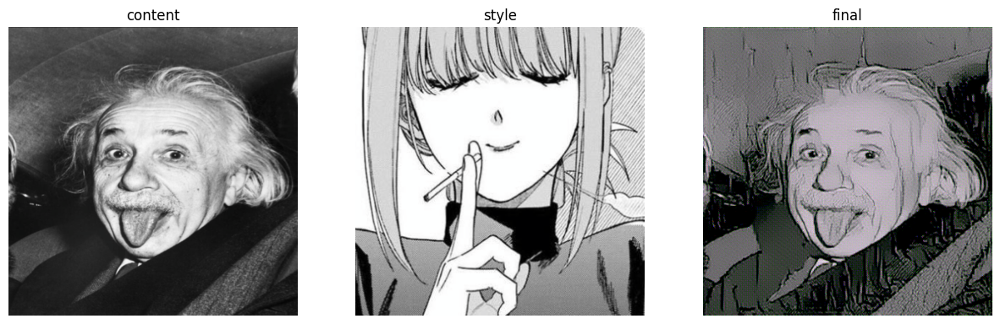

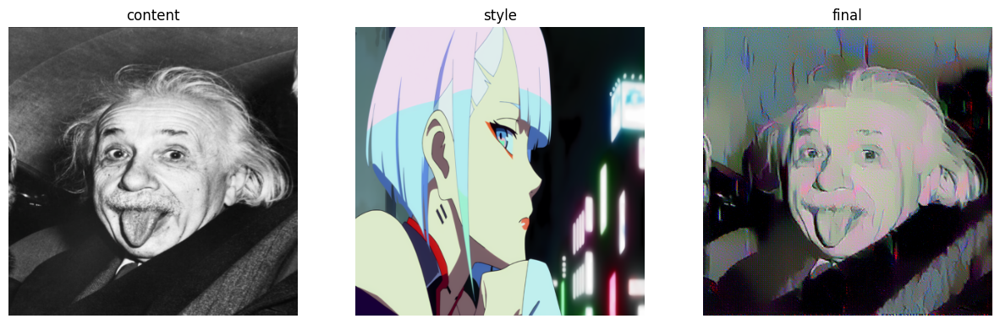

In [ ]:
mobile_formula(content2,style2)

mobilenet
doing style transfer for content0:
with style0


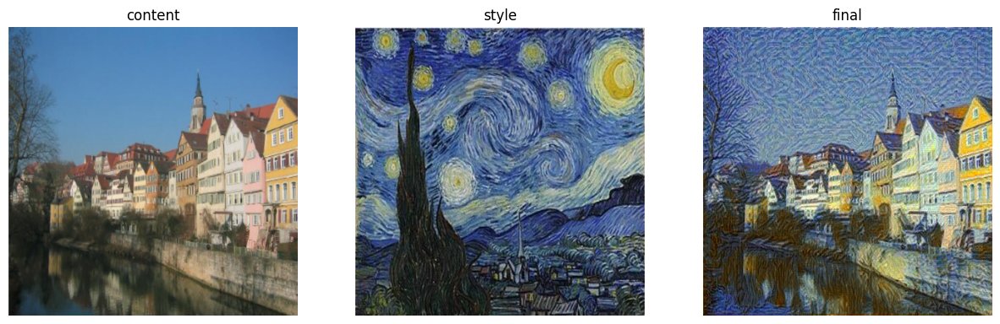

inception-v3
doing style transfer for content0:
with style0


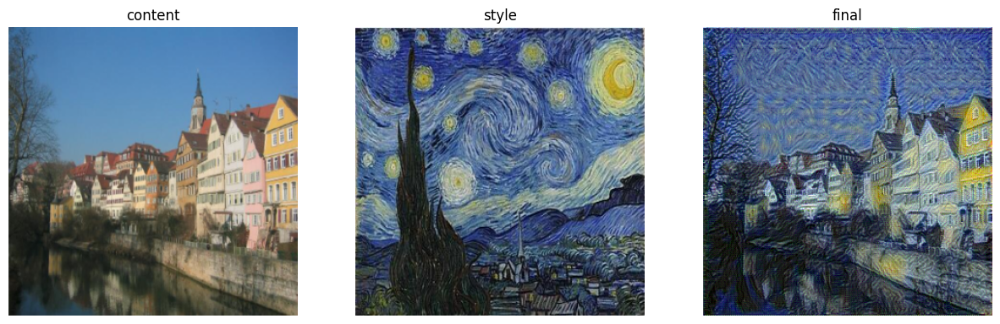

efficientnet
doing style transfer for content0:
with style0


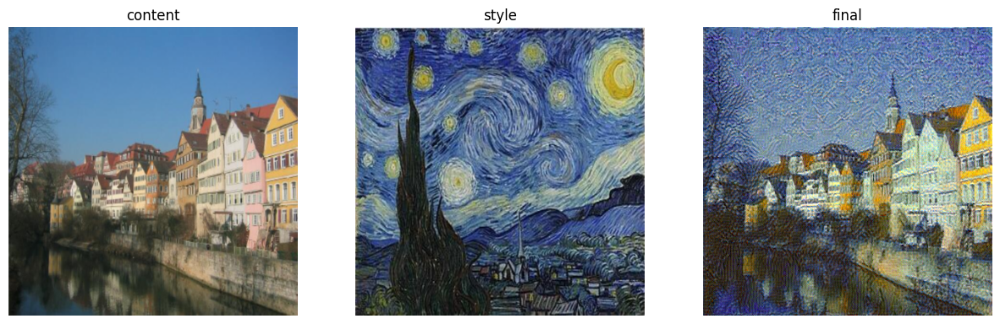

vgg-16
doing style transfer for content0:
with style0


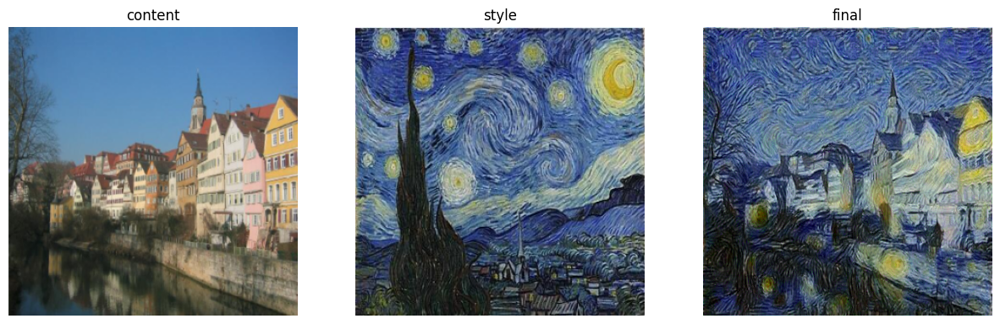

In [ ]:
print("mobilenet")
mobile_formula(['content2'],['style2'])
print("inception-v3")

incept_formula(['content2'],['style2'])
print("efficientnet")

efficient_formula(['content2'],['style2'])
print("vgg-16")

vgg_formula(['content2'],['style2'])
